<a href="https://colab.research.google.com/github/ShevchenkOksana/Computer-Vision/blob/main/Semantic_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# https://drive.google.com/file/d/1jEx2PCrB2poHSmN7CrBxzY5To-RYLOE7/view?usp=sharing
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1jEx2PCrB2poHSmN7CrBxzY5To-RYLOE7' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1jEx2PCrB2poHSmN7CrBxzY5To-RYLOE7" -O binary_dataset.zip && rm -rf /tmp/cookies.txt
!unzip -q binary_dataset.zip


--2023-12-07 18:32:06--  https://docs.google.com/uc?export=download&confirm=t&id=1jEx2PCrB2poHSmN7CrBxzY5To-RYLOE7
Resolving docs.google.com (docs.google.com)... 142.251.6.101, 142.251.6.113, 142.251.6.100, ...
Connecting to docs.google.com (docs.google.com)|142.251.6.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0o-28-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/if1m8k454h39d57b62d5fd8er2ml1eeu/1701973875000/05594727393003495587/*/1jEx2PCrB2poHSmN7CrBxzY5To-RYLOE7?e=download&uuid=e1dce644-75e4-4b2f-8cef-3590c1cd4c3f [following]
--2023-12-07 18:32:06--  https://doc-0o-28-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/if1m8k454h39d57b62d5fd8er2ml1eeu/1701973875000/05594727393003495587/*/1jEx2PCrB2poHSmN7CrBxzY5To-RYLOE7?e=download&uuid=e1dce644-75e4-4b2f-8cef-3590c1cd4c3f
Resolving doc-0o-28-docs.googleusercontent.com (doc-0o-28-docs.googleusercontent.com)... 173.194.195.132, 260

In [ ]:
!pip install segmentation_models_pytorch torchmetrics > /dev/null

In [ ]:
import os
import sys
from typing import List, Tuple

import cv2
import numpy as np
import albumentations as albu
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import segmentation_models_pytorch as smp
from torchmetrics import JaccardIndex

import matplotlib.pyplot as plt

## Dataset: [Semantic Segmentation Drone Dataset](https://www.kaggle.com/datasets/santurini/semantic-segmentation-drone-dataset)

In [ ]:
def read_image(path: str) -> str:
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


def read_mask(path: str) -> str:
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    img = (img > 128).astype("uint8")  # NOTE: do not comment this line!
    return img

In [ ]:
def create_dataset(imgs_dir: str, labels_dir: str) -> List[Tuple[str, str]]:
    dataset = []
    for file in sorted(os.listdir(imgs_dir)):
        if not os.path.exists(os.path.join(labels_dir, file)):
            continue
        dataset.append((os.path.join(imgs_dir, file), os.path.join(labels_dir, file)))
    return dataset


dataset = create_dataset("binary_dataset/original_images", "binary_dataset/images_semantic")
train = dataset[:300]
valid = dataset[300:]

len(dataset), len(train), len(valid)

(400, 300, 100)

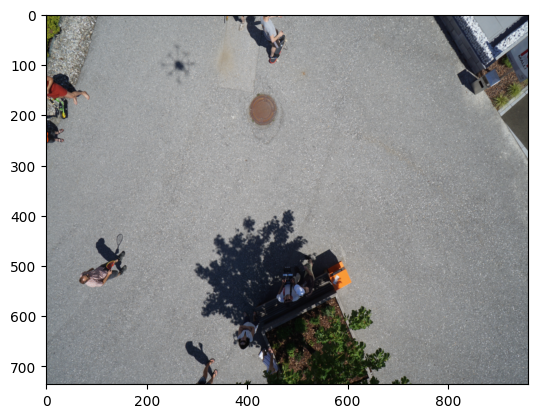

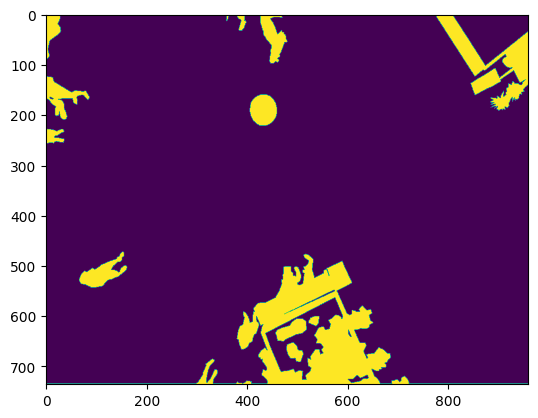

In [ ]:
plt.imshow(read_image(train[0][0]))
plt.show()

plt.imshow(read_mask(train[0][1]))
plt.show();

### Dataset & DataLoaders

In [ ]:
class SegmentationDataset(Dataset):
    def __init__(self, samples: List[Tuple[str, str]], augmentations: albu.Compose) -> None:
        super().__init__()
        self.samples = samples
        self.augs = augmentations

    def __len__(self) -> int:
        return len(self.samples)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, torch.Tensor]:
        sample = self.samples[idx]

        image = read_image(sample[0])
        mask = read_mask(sample[1])

        augmented = self.augs(image=image, mask=mask)
        image = torch.from_numpy(augmented["image"]).permute(2, 0, 1)
        mask = torch.from_numpy(augmented["mask"]).float().unsqueeze(0)

        return image, mask

### Modeling

In [ ]:
def train_one_epoch(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    optimizer: optim.Optimizer,
    device: str = "cpu",
    verbose: bool = True,
) -> dict:
    model.train()

    losses = []

    with tqdm(total=len(loader), desc="  training", file=sys.stdout, ncols=100, disable=not verbose) as progress:
        for x_batch, y_true in loader:
            x_batch = x_batch.to(device)
            y_true = y_true.to(device)

            optimizer.zero_grad()

            logits = model(x_batch)

            loss = criterion(logits, y_true)
            loss.backward()
            losses.append(loss.item())

            progress.set_postfix_str(f"loss {losses[-1]:.4f}")

            optimizer.step()

            progress.update(1)

    logs = {
        "losses": np.array(losses),
    }
    return logs

In [ ]:
# @torch.inference_mode()
def evaluate(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    metric_fn: callable,
    device: str,
    verbose: bool = True,
) -> dict:
    model.eval()

    losses = []
    metric_values = []

    with torch.no_grad():
        with tqdm(total=len(loader), desc="evaluation", file=sys.stdout, ncols=100, disable=not verbose) as progress:
            for x_batch, y_true in loader:
                x_batch = x_batch.to(device)
                y_true = y_true.to(device)

                # model.to(device)

                logits = model(x_batch)

                loss = criterion(logits, y_true)
                losses.append(loss.item())

                # Compute the evaluation metric using metric_fn
                metric_value = metric_fn(logits, y_true)
                metric_values.append(metric_value.item())

                progress.set_postfix_str(f"loss {losses[-1]:.4f} - metric {metric_values[-1]:.4f}")
                progress.update(1)

    average_loss = sum(losses) / len(losses)
    average_metric = sum(metric_values) / len(metric_values)

    logs = {
        "average_loss": average_loss,
        "iou": average_metric,
    }
    return logs


In [ ]:
def test_model (batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr):
  device = "cuda" if torch.cuda.is_available() else "cpu"
  print(f"Going to use '{device}' device!")

  num_workers = os.cpu_count() // 2
  model_input_size = (picture_size, picture_size)

  train_augs = albu.Compose([
    albu.HorizontalFlip(p=0.5),
    albu.ShiftScaleRotate(scale_limit=0.9, rotate_limit=15, shift_limit=0.1, p=0.5),
    albu.RandomBrightnessContrast(p=0.3),
    albu.Resize(*model_input_size),
    albu.Normalize(),
  ])
  train_loader = DataLoader(
    SegmentationDataset(train, train_augs),
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=True,
    drop_last=True,
    persistent_workers=True,
  )

  valid_augs = albu.Compose([
    albu.Resize(*model_input_size),
    albu.Normalize(),
  ])
  valid_loader = DataLoader(
    SegmentationDataset(valid, valid_augs),
    batch_size=batch_size,
    num_workers=num_workers,
    shuffle=False,
    drop_last=False,
 )

  torch.manual_seed(42)
  model = model.to(device)
  print("Number of trainable parameters -", sum(p.numel() for p in model.parameters() if p.requires_grad))

  optimizer = optim.Adam(model.parameters(), lr=learn_rate)
  loss_fn = smp.losses.JaccardLoss(mode="binary").to(device)
  scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="max", factor=factor_val, patience=patience_val, verbose=show_pr)
  metric_fn = JaccardIndex(task="binary", threshold=0.5).to(device)

  train_losses = []
  valid_scores = []

  for ep in range(n_epochs):
    print(f"\nEpoch {ep + 1:2d}/{n_epochs:2d}")

    train_logs = train_one_epoch(model, train_loader, loss_fn, optimizer, device, verbose=show_pr)
    train_losses.append(np.mean(train_logs["losses"]))
    print("          loss:", train_losses[-1])


    valid_logs = evaluate(model, valid_loader, loss_fn, metric_fn, device, verbose=show_pr)
    valid_scores.append(np.mean(valid_logs["iou"]))
    print("           iou:", valid_scores[-1])

    scheduler.step(valid_scores[-1])

  fix, axes = plt.subplots(ncols=2, figsize=(20, 6))

  axes[0].plot(np.arange(len(train_losses)), train_losses, ".-")
  axes[0].set_title(f"Train loss - Batch Size: {batch_size}, Epochs: {n_epochs}, Model: {model.__class__.__name__}\n Lerning rate: {learn_rate}, Factor: {factor_val}, Patience: {patience_val}")
  axes[0].grid()

  axes[1].plot(np.arange(len(valid_scores)), valid_scores, ".-")
  axes[1].set_title(f"Validation IoU - Batch Size: {batch_size}, Epochs: {n_epochs}, Model: {model.__class__.__name__}\n Lerning rate: {learn_rate}, Factor: {factor_val}, Patience: {patience_val}")
  axes[1].grid()

  model.eval()  # switch model to evaluation mode

  sample_index = 1
  sample = valid_loader.dataset.samples[sample_index]
  img, mask = read_image(sample[0]), read_mask(sample[1])
  augmented = valid_loader.dataset.augs(image=img, mask=mask)

# ploting
  fix, axes = plt.subplots(ncols=3, figsize=(20, 6))
  axes[0].imshow(cv2.resize(img, model_input_size))
  axes[0].set_title("Input image")


  x = torch.from_numpy(augmented["image"])
  x = x.permute(2, 0, 1).unsqueeze(0)
  x = x.to(device)
  with torch.inference_mode():
    predictions = model(x).sigmoid()
  predictions = predictions.detach().cpu().numpy()
  predictions = predictions[0, 0]
  axes[1].imshow((predictions >= 0.5).astype("uint8"))
  axes[1].set_title("Predicted mask")

  axes[2].imshow(augmented["mask"])
  axes[2].set_title("Ground truth mask");

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 344MB/s]


Going to use 'cuda' device!
Number of trainable parameters - 24436369

Epoch  1/10
  training: 100%|██████████████████████████████████████| 75/75 [00:48<00:00,  1.55it/s, loss 0.6040]
          loss: 0.6374687266349792
evaluation: 100%|██████████████████████| 25/25 [00:06<00:00,  3.93it/s, loss 0.5903 - metric 0.4098]
           iou: 0.4118635451793671

Epoch  2/10
  training: 100%|██████████████████████████████████████| 75/75 [00:37<00:00,  1.99it/s, loss 0.6702]
          loss: 0.5851163752873738
evaluation: 100%|██████████████████████| 25/25 [00:06<00:00,  4.11it/s, loss 0.6193 - metric 0.3808]
           iou: 0.4207411301136017

Epoch  3/10
  training: 100%|██████████████████████████████████████| 75/75 [00:37<00:00,  2.02it/s, loss 0.5596]
          loss: 0.6060831991831461
evaluation: 100%|██████████████████████| 25/25 [00:06<00:00,  4.15it/s, loss 0.5926 - metric 0.4074]
           iou: 0.45707023501396177

Epoch  4/10
  training: 100%|██████████████████████████████████████| 75/7

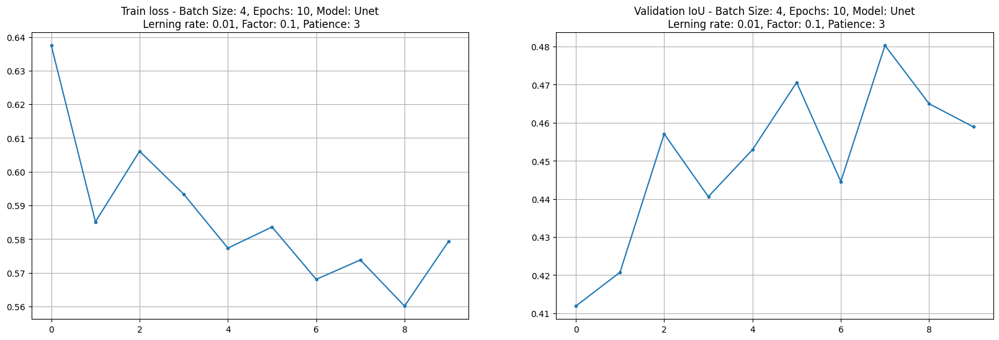

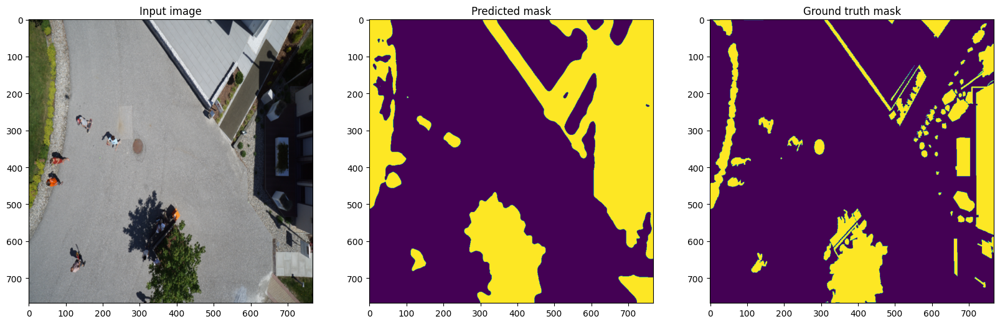

In [ ]:
model_unet = smp.Unet(classes=1)
test_model (4, 10, 768, 1e-2, 0.1, 3, model_unet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 111MB/s]


Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/10
  training: 100%|██████████████████████████████████████| 75/75 [00:35<00:00,  2.13it/s, loss 0.5816]
          loss: 0.6348270455996196
evaluation: 100%|██████████████████████| 25/25 [00:07<00:00,  3.50it/s, loss 0.6245 - metric 0.3757]
           iou: 0.39521575331687925

Epoch  2/10
  training: 100%|██████████████████████████████████████| 75/75 [00:31<00:00,  2.39it/s, loss 0.6612]
          loss: 0.58400630235672
evaluation: 100%|██████████████████████| 25/25 [00:06<00:00,  4.10it/s, loss 0.6445 - metric 0.3609]
           iou: 0.3733412033319473

Epoch  3/10
  training: 100%|██████████████████████████████████████| 75/75 [00:30<00:00,  2.48it/s, loss 0.5560]
          loss: 0.6179693055152893
evaluation: 100%|██████████████████████| 25/25 [00:07<00:00,  3.42it/s, loss 0.5338 - metric 0.4661]
           iou: 0.45537591695785523

Epoch  4/10
  training: 100%|██████████████████████████████████████| 75/75

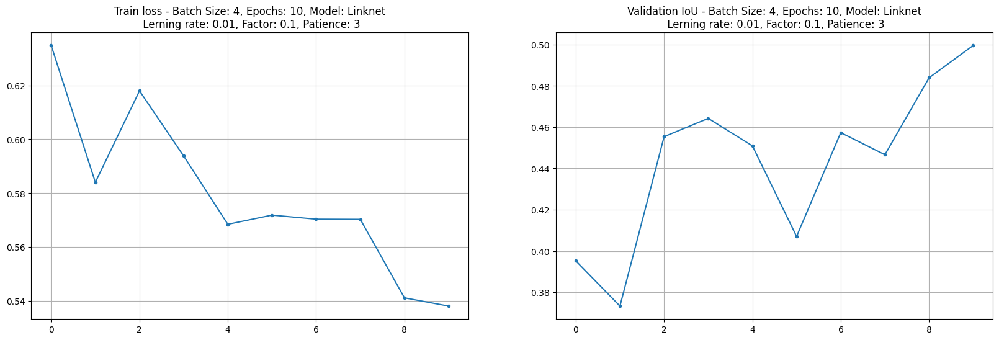

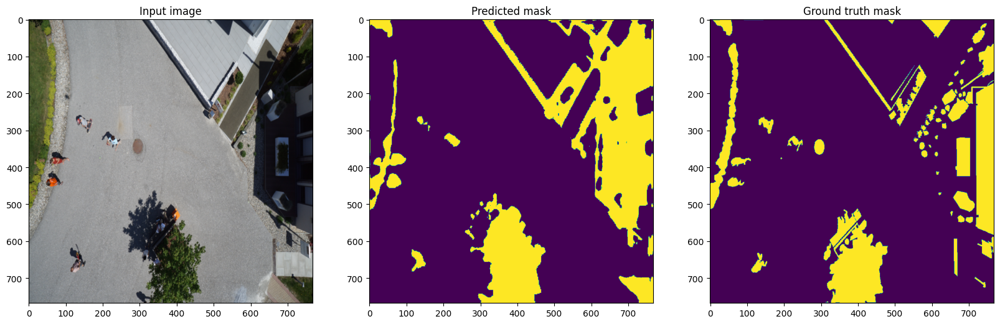

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (4, 10, 768, 1e-2, 0.1, 3, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

Going to use 'cuda' device!
Number of trainable parameters - 26007105

Epoch  1/10
  training: 100%|██████████████████████████████████████| 75/75 [02:01<00:00,  1.62s/it, loss 0.6973]
          loss: 0.7624351557095845
evaluation: 100%|██████████████████████| 25/25 [00:12<00:00,  2.01it/s, loss 0.7476 - metric 0.2448]
           iou: 0.2382482558488846

Epoch  2/10
  training: 100%|██████████████████████████████████████| 75/75 [02:02<00:00,  1.63s/it, loss 0.7364]
          loss: 0.7132827281951905
evaluation: 100%|██████████████████████| 25/25 [00:12<00:00,  1.96it/s, loss 0.6994 - metric 0.3204]
           iou: 0.32163801193237307

Epoch  3/10
  training: 100%|██████████████████████████████████████| 75/75 [02:01<00:00,  1.62s/it, loss 0.5745]
          loss: 0.6356049052874247
evaluation: 100%|██████████████████████| 25/25 [00:14<00:00,  1.72it/s, loss 0.6090 - metric 0.3914]
           iou: 0.43640928030014037

Epoch  4/10
  training: 100%|██████████████████████████████████████| 75/

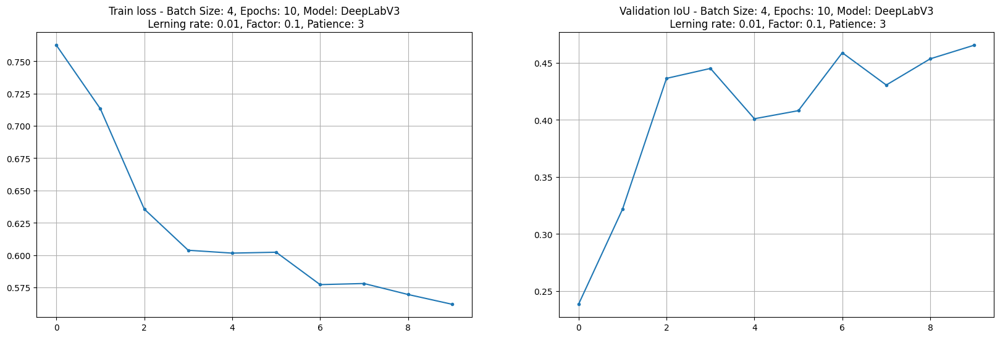

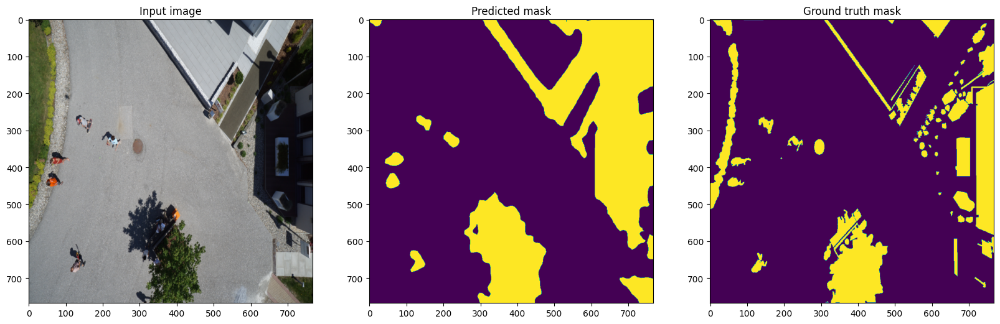

In [ ]:
model_deeplab = smp.DeepLabV3(classes=1, in_channels=3)
test_model(4, 10, 768, 1e-2, 0.1, 3, model_deeplab, True)

With using the same values for parameters:

* Batch Size: 4
* Epochs: 10
* Learning Rate: 0.01
* Factor: 0.1
* Patience: 3

The following architectures were tested:

* Unet
* Linknet
* DeepLab
* DeepLab with Resnet

The results are as follows:

*Unet*

    Loss: 0.5793777720133464, IoU: 0.4589400589466095

*Linknet*

    Loss: 0.538053859869639, IoU: 0.49952680230140684
    
*DeepLab*

    Loss: 0.5619409942626953, IoU: 0.46552359700202944


Linknet performs better than the others. Let's try to improve it.

To do this, change
* Learning Rate to 0.0001
* Factor to 0.05
* Patience: 2

Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/10
  training: 100%|██████████████████████████████████████| 75/75 [00:29<00:00,  2.51it/s, loss 0.6163]
          loss: 0.7448162547747295
evaluation: 100%|██████████████████████| 25/25 [00:07<00:00,  3.38it/s, loss 0.5833 - metric 0.5945]
           iou: 0.5812754023075104

Epoch  2/10
  training: 100%|██████████████████████████████████████| 75/75 [00:29<00:00,  2.53it/s, loss 0.5651]
          loss: 0.5661062407493591
evaluation: 100%|██████████████████████| 25/25 [00:05<00:00,  4.23it/s, loss 0.4699 - metric 0.6908]
           iou: 0.6632441735267639

Epoch  3/10
  training: 100%|██████████████████████████████████████| 75/75 [00:29<00:00,  2.55it/s, loss 0.3651]
          loss: 0.4914569552739461
evaluation: 100%|██████████████████████| 25/25 [00:07<00:00,  3.37it/s, loss 0.4154 - metric 0.7177]
           iou: 0.6763010001182557

Epoch  4/10
  training: 100%|██████████████████████████████████████| 75/75

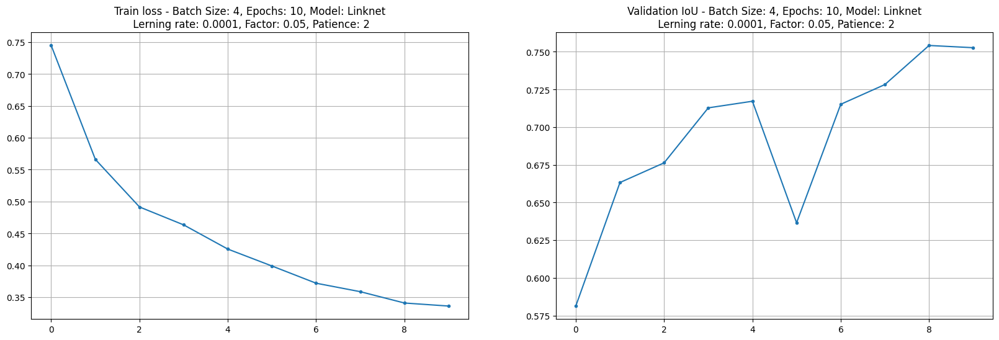

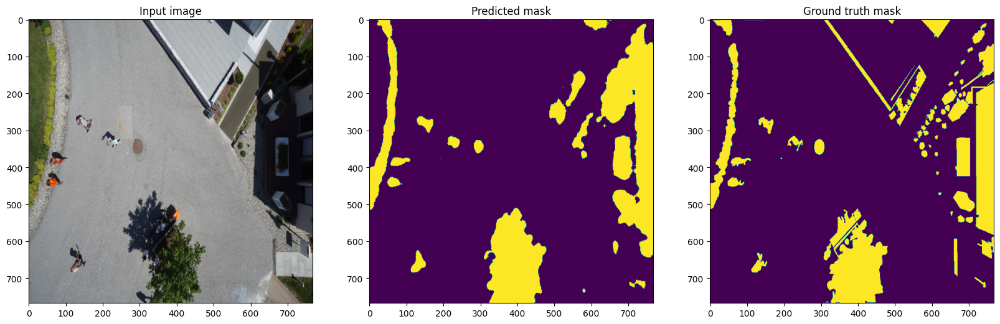

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (4, 10, 768, 1e-4, 0.05, 2, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

After chenging

* Learning Rate from 0.01 to 0.0001
* Factor from 0.1 to 0.05
* Patience: from 3 to 2

Model gives better results:

    Loss: 0.33602892875671386, Iou: 0.7527075386047364

Previously:

    Loss: 0.538053859869639, IoU: 0.49952680230140684
    
Now, let's try to make the next changes:

* Batch size to 8
* Epochs to 20

Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/20
  training: 100%|██████████████████████████████████████| 37/37 [00:28<00:00,  1.28it/s, loss 0.7108]
          loss: 0.7847221703142733
evaluation: 100%|██████████████████████| 13/13 [00:06<00:00,  1.97it/s, loss 0.7279 - metric 0.4569]
           iou: 0.45087067439005923

Epoch  2/20
  training: 100%|██████████████████████████████████████| 37/37 [00:28<00:00,  1.31it/s, loss 0.5415]
          loss: 0.6659090631716961
evaluation: 100%|██████████████████████| 13/13 [00:06<00:00,  1.88it/s, loss 0.5793 - metric 0.6335]
           iou: 0.6463453127787664

Epoch  3/20
  training: 100%|██████████████████████████████████████| 37/37 [00:28<00:00,  1.31it/s, loss 0.4859]
          loss: 0.558493122861192
evaluation: 100%|██████████████████████| 13/13 [00:05<00:00,  2.17it/s, loss 0.4827 - metric 0.7010]
           iou: 0.6839816249333895

Epoch  4/20
  training: 100%|██████████████████████████████████████| 37/37

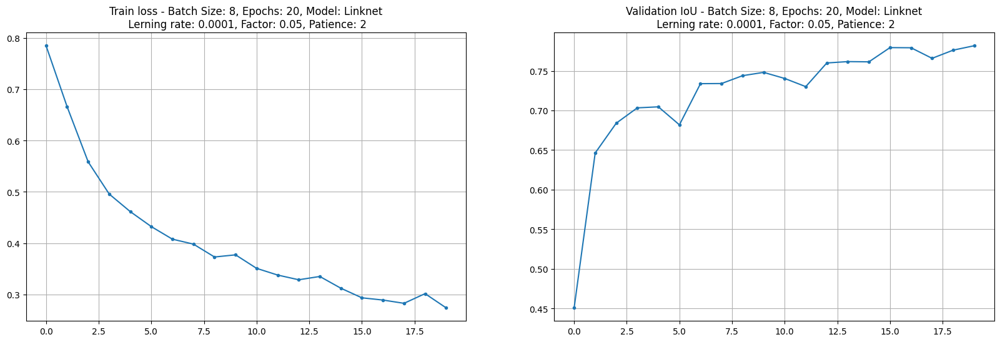

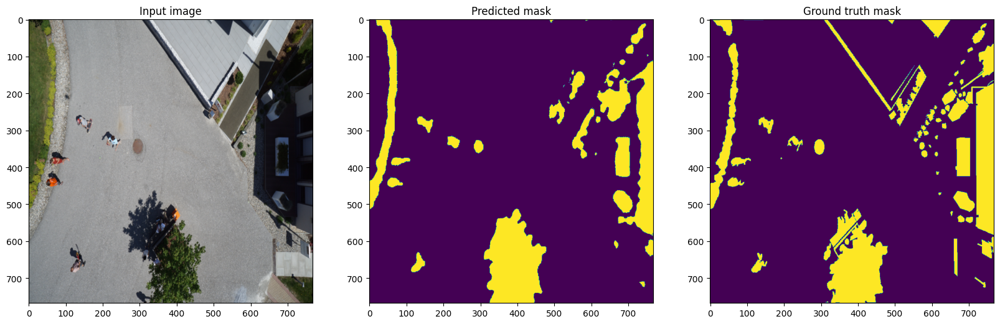

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (8, 20, 768, 1e-4, 0.05, 2, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

After chenging

* Batch size to 8
* Epochs to 20

Model gives better results:

    Loss: 0.2741209945163211, IoU: 0.781725865143996

Previously:

    Loss: 0.33602892875671386, IoU: 0.7527075386047364
  

Now, let's try to make the next changes:
* Learning Rate from 0.0001 to 0.000001
* Factor from 0.05 to 0.01
* Epochs from 20 to 50



Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 190MB/s]


Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/50
  training: 100%|██████████████████████████████████████| 37/37 [00:35<00:00,  1.04it/s, loss 0.7816]
          loss: 0.8107032002629461
evaluation: 100%|██████████████████████| 13/13 [00:07<00:00,  1.80it/s, loss 0.8014 - metric 0.1962]
           iou: 0.19172895642427298

Epoch  2/50
  training: 100%|██████████████████████████████████████| 37/37 [00:28<00:00,  1.31it/s, loss 0.7503]
          loss: 0.8089699696850132
evaluation: 100%|██████████████████████| 13/13 [00:05<00:00,  2.22it/s, loss 0.8057 - metric 0.1874]
           iou: 0.184299176129011

Epoch  3/50
  training: 100%|██████████████████████████████████████| 37/37 [00:32<00:00,  1.14it/s, loss 0.7792]
          loss: 0.8093572710011456
evaluation: 100%|██████████████████████| 13/13 [00:09<00:00,  1.44it/s, loss 0.8052 - metric 0.1886]
           iou: 0.1852209728497725

Epoch  4/50
  training: 100%|██████████████████████████████████████| 37/37

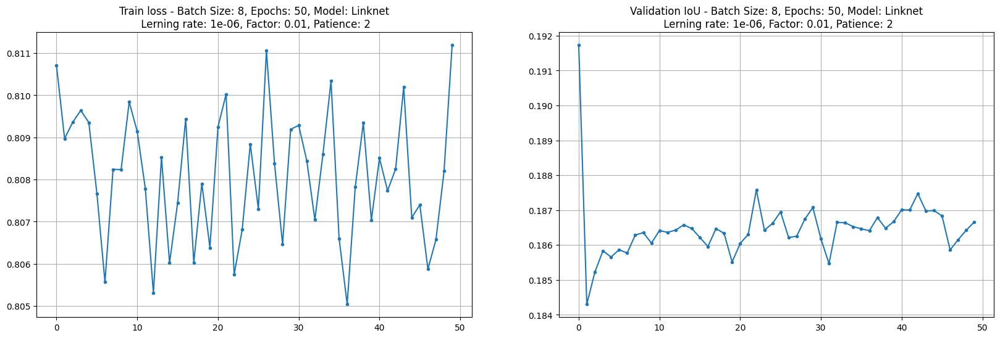

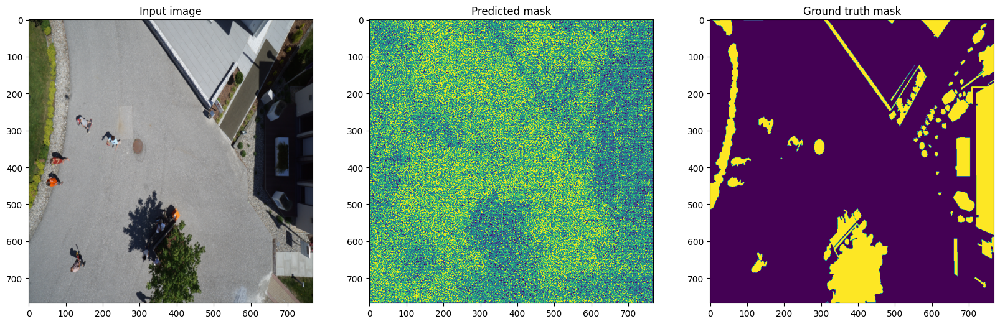

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (8, 50, 768, 1e-6, 0.01, 2, model_linknet, True)

After chenging

* Learning Rate from 0.0001 to 0.000001
* Factor from 0.05 to 0.01
* Epochs from 20 to 50

Model gives worse results:

    Loss: 0.811187707089089, IoU: 0.18666306940408853

Previously for:

* Learning Rate 0.0001
* Factor 0.05
* Epochs 20


    Loss: 0.2741209945163211, IoU: 0.781725865143996
  
Let's go back

* Learning Rate 0.0001
* Factor 0.05

And just change

* Epochs 50

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 191MB/s]


Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/50
  training: 100%|██████████████████████████████████████| 37/37 [00:33<00:00,  1.09it/s, loss 0.7381]
          loss: 0.8013187759631389
evaluation: 100%|██████████████████████| 13/13 [00:05<00:00,  2.30it/s, loss 0.7728 - metric 0.3070]
           iou: 0.3054434175674732

Epoch  2/50
  training: 100%|██████████████████████████████████████| 37/37 [00:33<00:00,  1.12it/s, loss 0.5937]
          loss: 0.7085100090181505
evaluation: 100%|██████████████████████| 13/13 [00:07<00:00,  1.63it/s, loss 0.6459 - metric 0.5021]
           iou: 0.5309439507814554

Epoch  3/50
  training: 100%|██████████████████████████████████████| 37/37 [00:28<00:00,  1.32it/s, loss 0.5403]
          loss: 0.6175252585797697
evaluation: 100%|██████████████████████| 13/13 [00:06<00:00,  1.88it/s, loss 0.5362 - metric 0.6399]
           iou: 0.5742421127282656

Epoch  4/50
  training: 100%|██████████████████████████████████████| 37/37

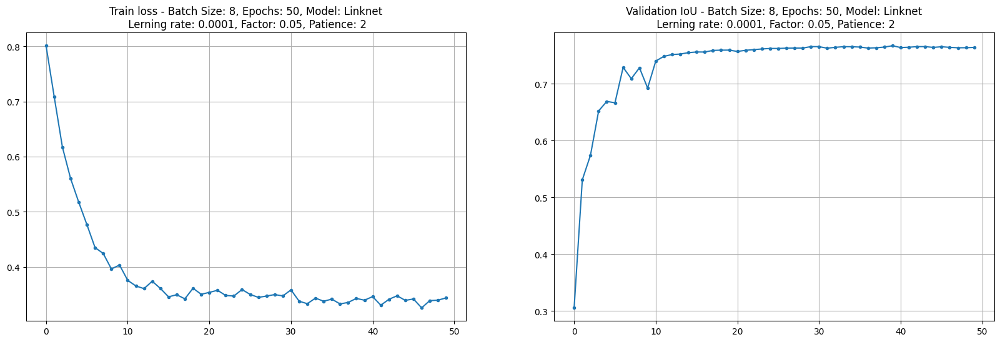

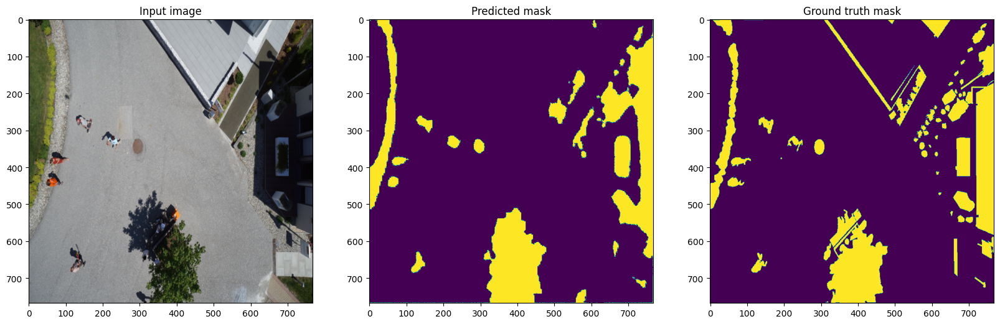

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (8, 50, 768, 1e-4, 0.05, 2, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

For

* Learning Rate 0.0001
* Factor 0.05
* Epochs 50

Model gives worse results:

    Loss 0.3436845814859545, Iou 0.7642379907461313

Previously for:

* Learning Rate 0.0001
* Factor 0.05
* Epochs 20


    Loss 0.2741209945163211, Iou 0.781725865143996
  
The model got worse maybe because it was trained too slowly, didn't adjust well to changes and learned too much from the training data, leading to overfitting.

Let's try the next changes:

* Learning Rate 0.001
* Factor 0.1
* Epochs 50


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 198MB/s]


Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/50
  training: 100%|██████████████████████████████████████| 37/37 [00:36<00:00,  1.02it/s, loss 0.5969]
          loss: 0.6967562485385586
evaluation: 100%|██████████████████████| 13/13 [00:07<00:00,  1.66it/s, loss 0.6068 - metric 0.4641]
           iou: 0.5019959096725171

Epoch  2/50
  training: 100%|██████████████████████████████████████| 37/37 [00:27<00:00,  1.34it/s, loss 0.4885]
          loss: 0.5713963750246409
evaluation: 100%|██████████████████████| 13/13 [00:08<00:00,  1.59it/s, loss 0.5399 - metric 0.4802]
           iou: 0.4977343472150656

Epoch  3/50
  training: 100%|██████████████████████████████████████| 37/37 [00:29<00:00,  1.26it/s, loss 0.4579]
          loss: 0.5326537103266329
evaluation: 100%|██████████████████████| 13/13 [00:07<00:00,  1.67it/s, loss 0.5322 - metric 0.4878]
           iou: 0.4452806825821216

Epoch  4/50
  training: 100%|██████████████████████████████████████| 37/37

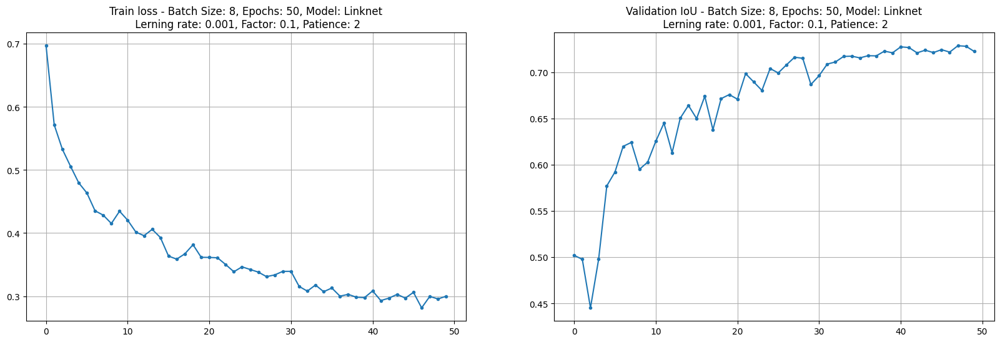

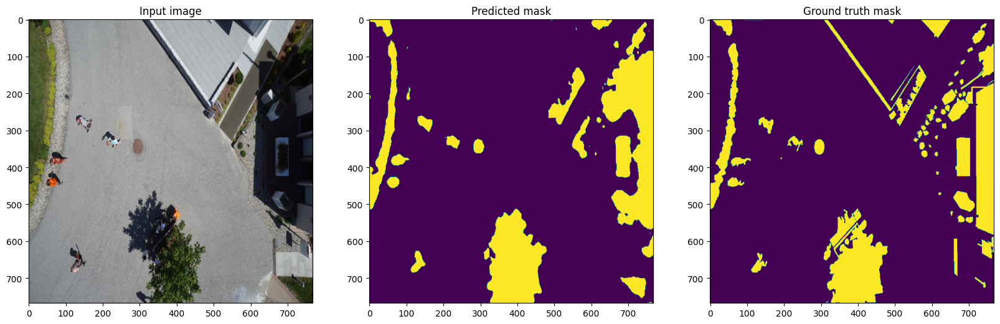

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (8, 50, 768, 1e-3, 0.1, 2, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

Results that we have:

Learning Rate 0.0001, Factor 0.05, Epochs 20:

    Loss: 0.2741209945163211, IoU: 0.781725865143996

Learning Rate 0.0001, Factor 0.05, Epochs 50:

    Loss: 0.3436845814859545, IoU: 0.7642379907461313

Learning Rate 0.001, Factor 0.1, Epochs 50:

    Loss: 0.29996521408493454, IoU: 0.7223284244537354

The balance between the hyperparameters can affect the results. Let's try hyperparameter values between the previous:

* Learning Rate 0.005
* Factor 0.1
* Epochs 35




    
  


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 229MB/s]


Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/35
  training: 100%|██████████████████████████████████████| 37/37 [00:38<00:00,  1.05s/it, loss 0.5271]
          loss: 0.6336352809055431
evaluation: 100%|██████████████████████| 13/13 [00:07<00:00,  1.78it/s, loss 0.6660 - metric 0.3349]
           iou: 0.3091132514751874

Epoch  2/35
  training: 100%|██████████████████████████████████████| 37/37 [00:27<00:00,  1.34it/s, loss 0.4399]
          loss: 0.5636447313669566
evaluation: 100%|██████████████████████| 13/13 [00:06<00:00,  1.93it/s, loss 0.6138 - metric 0.3866]
           iou: 0.392769279388281

Epoch  3/35
  training: 100%|██████████████████████████████████████| 37/37 [00:34<00:00,  1.06it/s, loss 0.5562]
          loss: 0.5727794991957175
evaluation: 100%|██████████████████████| 13/13 [00:09<00:00,  1.37it/s, loss 0.6023 - metric 0.3968]
           iou: 0.353831484913826

Epoch  4/35
  training: 100%|██████████████████████████████████████| 37/37 [

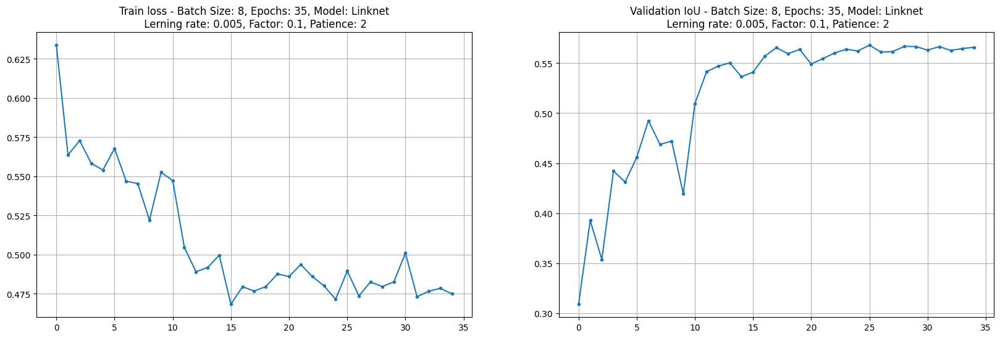

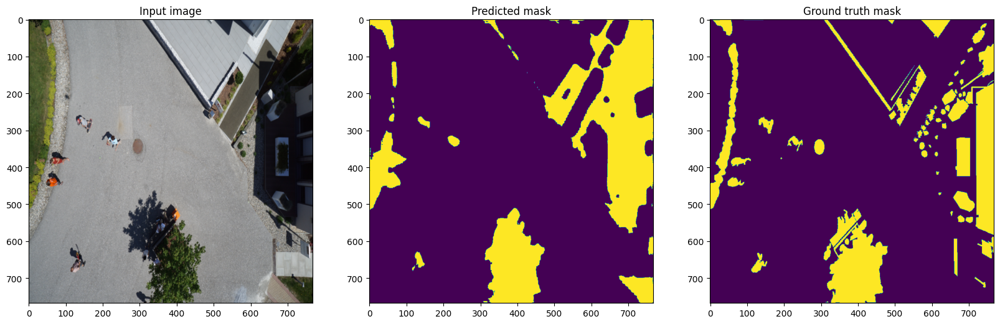

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (8, 35, 768, 5e-3, 0.1, 2, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 229MB/s]


Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/35
  training: 100%|██████████████████████████████████████| 37/37 [00:38<00:00,  1.05s/it, loss 0.5271]
          loss: 0.6336352809055431
evaluation: 100%|██████████████████████| 13/13 [00:07<00:00,  1.78it/s, loss 0.6660 - metric 0.3349]
           iou: 0.3091132514751874

Epoch  2/35
  training: 100%|██████████████████████████████████████| 37/37 [00:27<00:00,  1.34it/s, loss 0.4399]
          loss: 0.5636447313669566
evaluation: 100%|██████████████████████| 13/13 [00:06<00:00,  1.93it/s, loss 0.6138 - metric 0.3866]
           iou: 0.392769279388281

Epoch  3/35
  training: 100%|██████████████████████████████████████| 37/37 [00:34<00:00,  1.06it/s, loss 0.5562]
          loss: 0.5727794991957175
evaluation: 100%|██████████████████████| 13/13 [00:09<00:00,  1.37it/s, loss 0.6023 - metric 0.3968]
           iou: 0.353831484913826

Epoch  4/35
  training: 100%|██████████████████████████████████████| 37/37 [

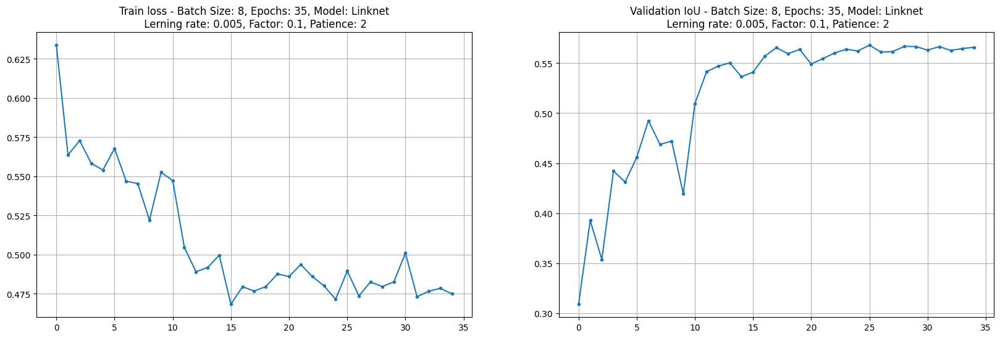

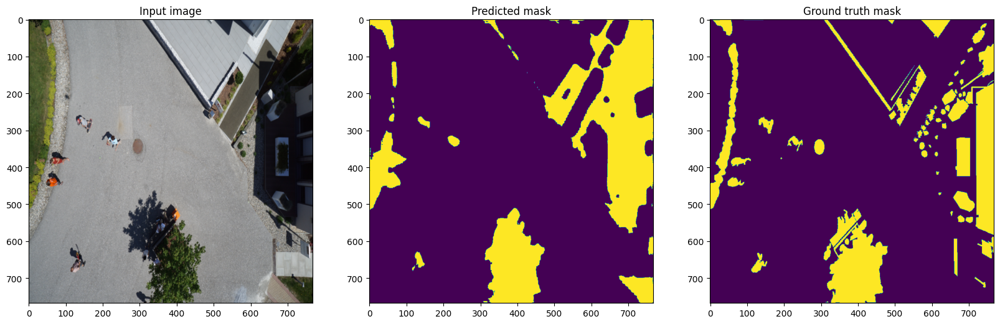

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (8, 35, 768, 5e-3, 0.05, 2, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/50
  training: 100%|██████████████████████████████████████| 37/37 [00:29<00:00,  1.27it/s, loss 0.5870]
          loss: 0.6431011863656946
evaluation: 100%|██████████████████████| 13/13 [00:06<00:00,  2.01it/s, loss 0.6729 - metric 0.3289]
           iou: 0.3326273870009642

Epoch  2/50
  training: 100%|██████████████████████████████████████| 37/37 [00:28<00:00,  1.28it/s, loss 0.4312]
          loss: 0.5631264351509713
evaluation: 100%|██████████████████████| 13/13 [00:06<00:00,  2.00it/s, loss 0.6194 - metric 0.3805]
           iou: 0.3596834781078192

Epoch  3/50
  training: 100%|██████████████████████████████████████| 37/37 [00:28<00:00,  1.30it/s, loss 0.5567]
          loss: 0.5873543314031653
evaluation: 100%|██████████████████████| 13/13 [00:08<00:00,  1.49it/s, loss 0.5943 - metric 0.4062]
           iou: 0.4671562359883235

Epoch  4/50
  training: 100%|██████████████████████████████████████| 37/37

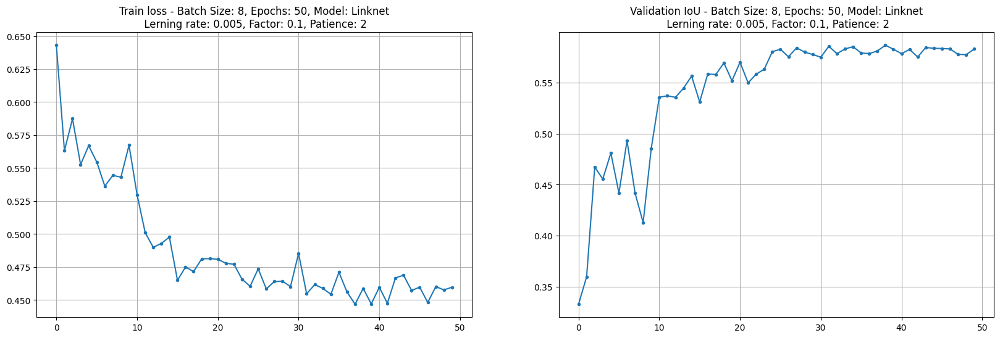

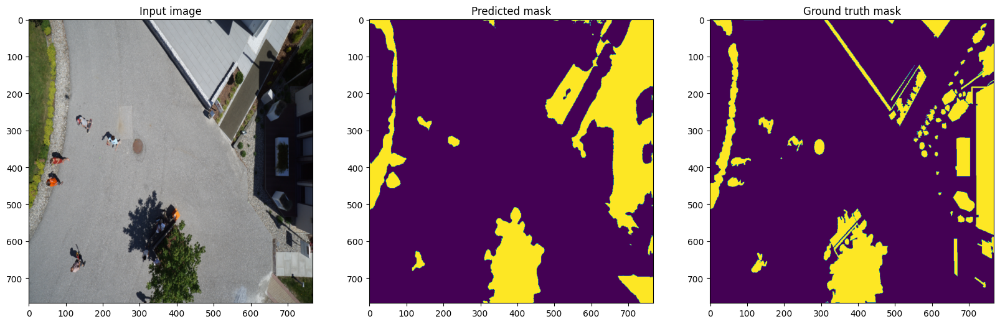

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (8, 50, 768, 5e-3, 0.1, 2, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

Results that we have:

Learning Rate 0.0001, Factor 0.05, Epochs 20:

    Loss: 0.2741209945163211, IoU: 0.781725865143996

Learning Rate 0.0001, Factor 0.05, Epochs 50:

    Loss: 0.3436845814859545, IoU: 0.7642379907461313

Learning Rate 0.001, Factor 0.1, Epochs 50:

    Loss: 0.29996521408493454, IoU: 0.7223284244537354

Learning Rate 0.005, Factor 0.1, Epochs 35:

    Loss: 0.47503370529896505, IoU: 0.5657049486270318

Learning Rate 0.005, Factor 0.1, Epochs 50:

    Loss: 0.45957273889232325, IoU: 0.58292500101603

The best result for:


Learning Rate 0.0001, Factor 0.05, Epochs 20:

    Loss: 0.2741209945163211, IoU: 0.781725865143996

Let's try:

Learning Rate 0.0001, Factor 0.05, Epochs 50






    
  


Going to use 'cuda' device!
Number of trainable parameters - 21771937

Epoch  1/30
  training: 100%|██████████████████████████████████████| 37/37 [00:30<00:00,  1.20it/s, loss 0.7302]
          loss: 0.7856328970677143
evaluation: 100%|██████████████████████| 13/13 [00:06<00:00,  2.09it/s, loss 0.7495 - metric 0.3005]
           iou: 0.3071996351847282

Epoch  2/30
  training: 100%|██████████████████████████████████████| 37/37 [00:32<00:00,  1.14it/s, loss 0.5615]
          loss: 0.6894630886412956
evaluation: 100%|██████████████████████| 13/13 [00:09<00:00,  1.43it/s, loss 0.6037 - metric 0.4805]
           iou: 0.5079695467765515

Epoch  3/30
  training: 100%|██████████████████████████████████████| 37/37 [00:32<00:00,  1.15it/s, loss 0.5095]
          loss: 0.5928358049006075
evaluation: 100%|██████████████████████| 13/13 [00:07<00:00,  1.75it/s, loss 0.5326 - metric 0.5689]
           iou: 0.5968445333150717

Epoch  4/30
  training: 100%|██████████████████████████████████████| 37/37

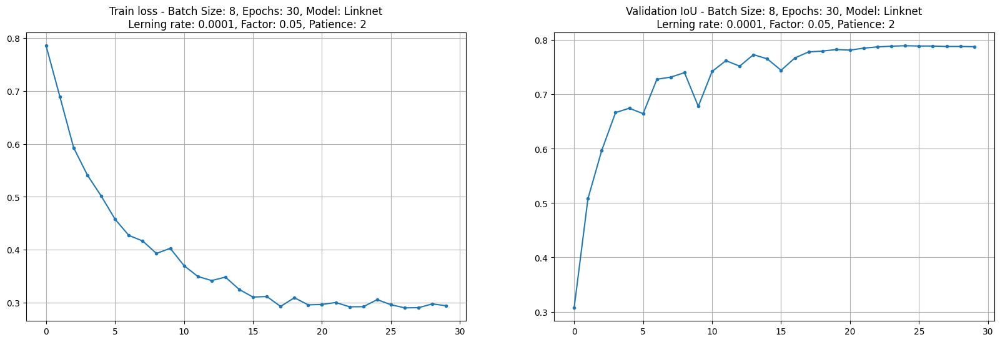

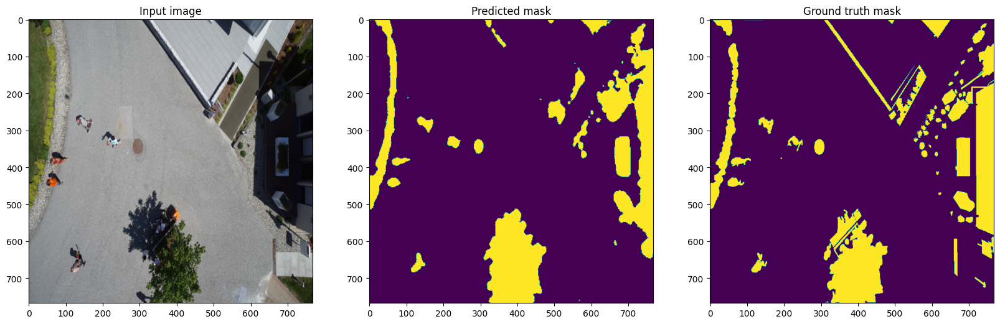

In [ ]:
model_linknet = smp.Linknet(classes=1)
test_model (8, 30, 768, 1e-4, 0.05, 2, model_linknet, True) #(batch_size, n_epochs, picture_size, learn_rate, factor_val, patience_val, model, show_pr)

Results that we have:

Learning Rate 0.0001, Factor 0.05, Epochs 20:

    Loss: 0.2741209945163211, IoU: 0.781725865143996

Learning Rate 0.0001, Factor 0.05, Epochs 30:

    Loss: 0.0.2940162130304285, IoU: 0.7874816151765677

Learning Rate 0.0001, Factor 0.05, Epochs 50:

    Loss: 0.3436845814859545, IoU: 0.7642379907461313

Learning Rate 0.001, Factor 0.1, Epochs 50:

    Loss: 0.29996521408493454, IoU: 0.7223284244537354

Learning Rate 0.005, Factor 0.1, Epochs 35:

    Loss: 0.47503370529896505, IoU: 0.5657049486270318

Learning Rate 0.005, Factor 0.1, Epochs 50:

    Loss: 0.45957273889232325, IoU: 0.58292500101603



The best result for:

Learning Rate 0.0001, Factor 0.05, Epochs 20:

    Loss: 0.2741209945163211, IoU: 0.781725865143996

And

 Learning Rate 0.0001, Factor 0.05, Epochs 30:

    Loss: 0.0.2940162130304285, IoU: 0.7874816151765677








    
  


Using this logic, we can continue to improve the model, for example increase banch size. For that we need better equipment (I received a 'CUDA OUT OF MEMORY ERROR' when trying to change parameters again).